# H12 locus artwork 

## Setup

In [1]:
%run locus-artwork-setup.ipynb

In [2]:
def plot_h12_percentiles(pop):
    fig, ax = plt.subplots(facecolor='w', figsize=(10, 3))
    
    # plot each chromosome
    x = np.arange(80, 100)
    all_h12s = []
    for c in '2', '3', 'X':
        # load gwss data
        _, _, _, h12, _, _ = load_h12_gwss(pop, c)
        all_h12s.append(h12)
        # plot 
        y = [np.percentile(h12, i) for i in x]
        ax.plot(x, y, marker='o', label=c)
        
    # plot all
    h12 = np.concatenate(all_h12s)
    y = [np.percentile(h12, i) for i in x]
    ax.plot(x, y, marker='o', label='all', color='k', lw=2)

    # tidy
    ax.set_ylim(bottom=0, top=0.4)
    ax.legend(loc='upper left', title='Chromosome')
    ax.set_xticks(x)
    ax.set_xlabel('Percentile')
    ax.set_ylabel('$H12$')
    ax.set_title(pop_defs[pop]['label'])
    
    plt.show()
    plt.close()
    

In [3]:
@functools.lru_cache(maxsize=None)
def get_h12_percentile(pop, q):
    h12s = []
    for c in '2', '3', 'X':
        # load gwss data
        _, _, _, h12, _, _ = load_h12_gwss(pop, c)
        h12s.append(h12)
    h12 = np.concatenate(h12s)
    return np.percentile(h12, q)
    

In [4]:
get_h12_percentile('bf_gam', 99)

0.162943052930056

In [5]:
get_h12_percentile('bf_gam', 98)

0.09913120962352417

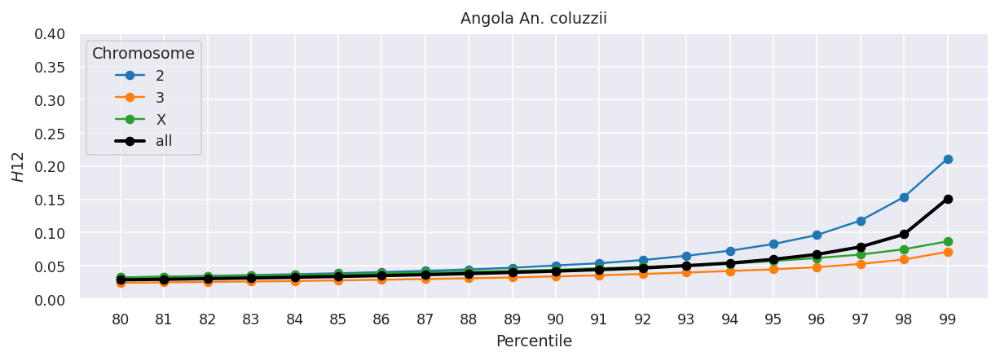

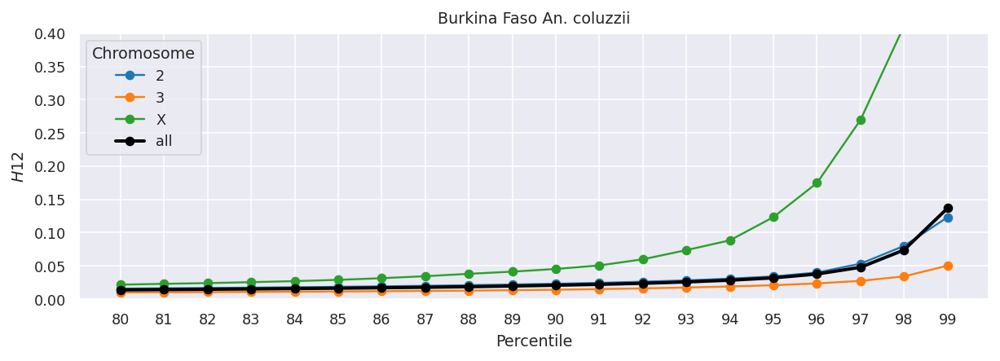

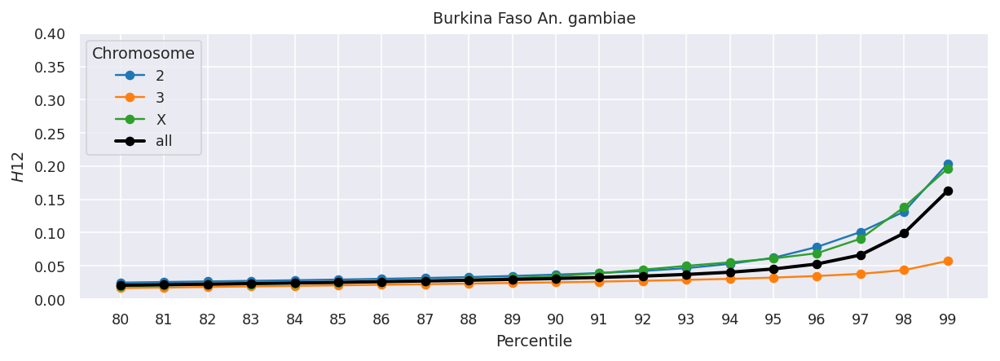

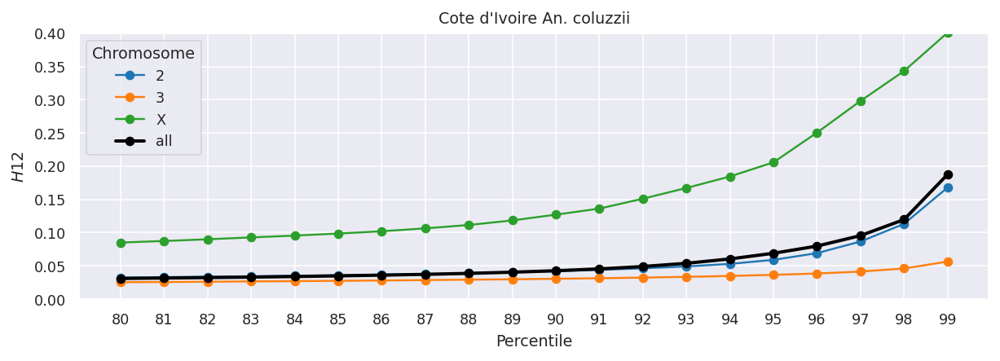

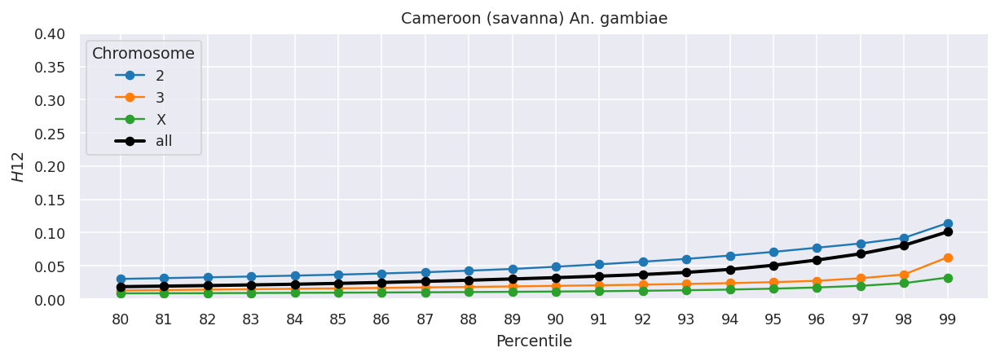

...

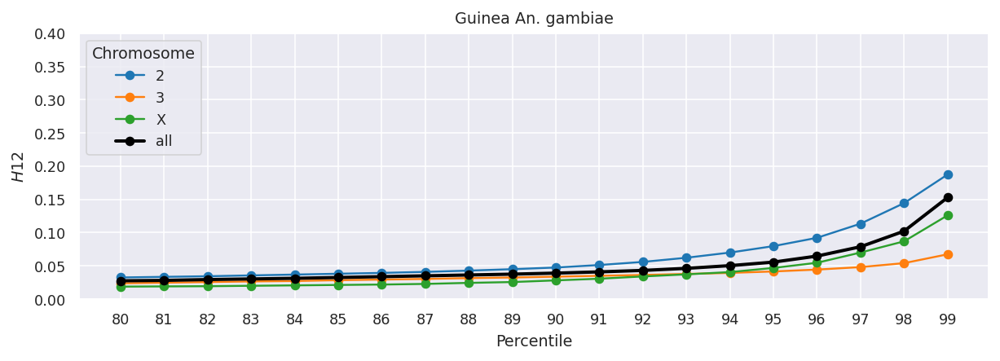

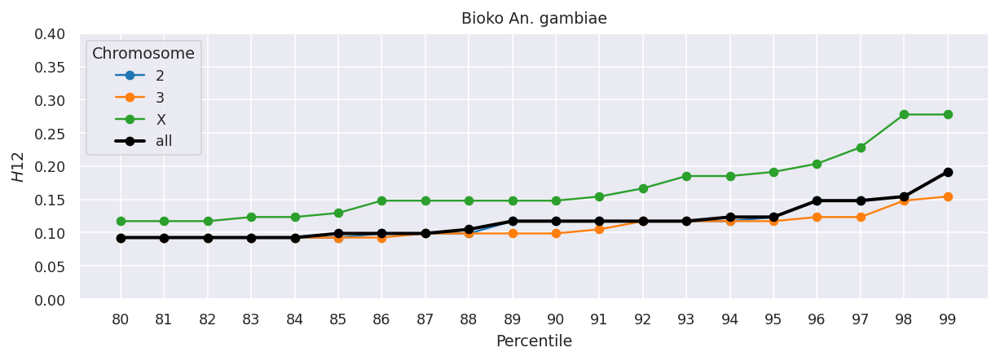

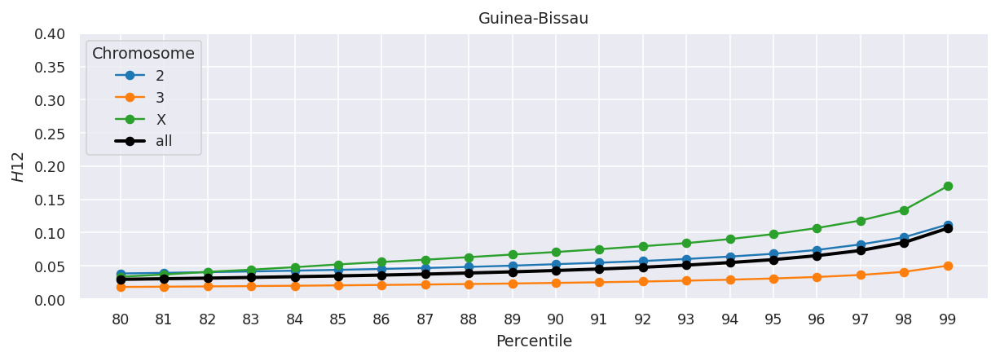

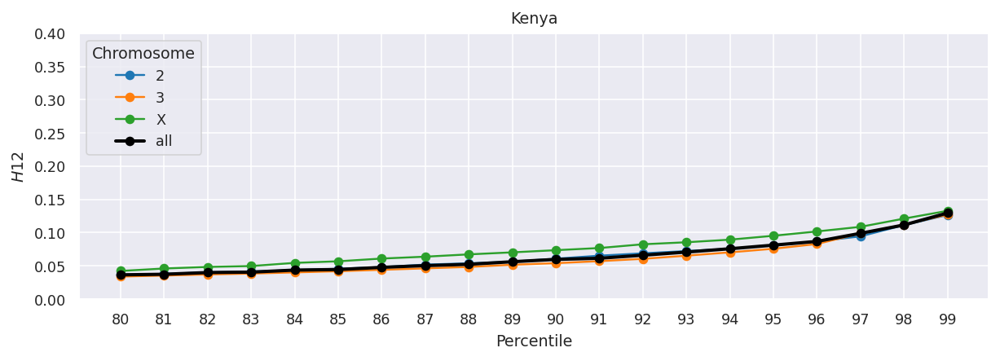

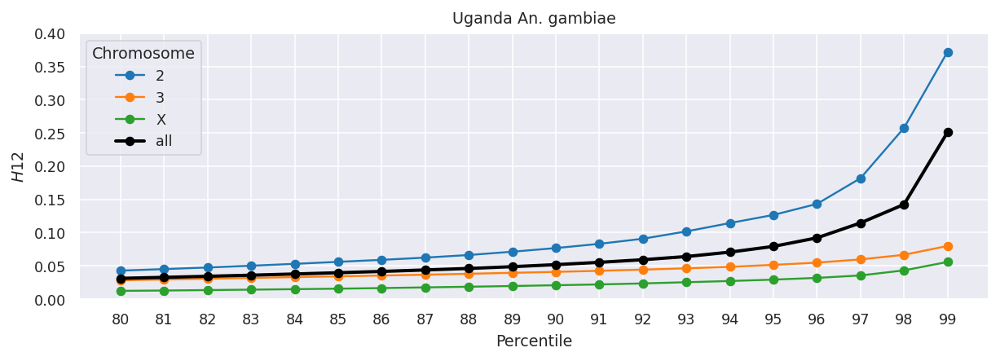

In [6]:
for pop in pop_defs:
    plot_h12_percentiles(pop)

In [7]:
def plot_h12(pop, chromosome, center, flank, ymax=None, ax=None, step=1, shift=0, 
             markersize=3, legend=False, genetic_distance=False, label=True, detail=False,
             median_filter=0, has_peak_windows=20):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 2), facecolor='w')
        
    # plot center line
    if genetic_distance:
        gcenter = mbp2cm(chromosome, center)
        ax.axvline(gcenter, color='w', linestyle='-', lw=4, zorder=0)
    else:
        ax.axvline(center, color='w', linestyle='-', lw=4, zorder=0)
        
    # figure out x limits
    if isinstance(flank, (int, float)):
        xlim = center - flank, center + flank
    elif isinstance(flank, tuple):
        xlim = center - flank[0], center + flank[1]
        
    # set color palette
    
    # load gwss data
    windows, gwindows, h1, h12, h123, h2_h1 = load_h12_gwss(pop, chromosome)
    if median_filter:
        h12 = scipy.ndimage.median_filter(h12, size=median_filter, mode='wrap')
    
    # setup data
    p = windows.mean(axis=1)/1e6
    gp = gwindows.mean(axis=1)
    if genetic_distance:
        x = gp
        xlim = mbp2cm(chromosome, xlim[0]), mbp2cm(chromosome, xlim[1])
    else:
        x = p
        
    # plot percentile
    t99 = get_h12_percentile(pop, 99)
#     ax.axhline(t99, color='gray', linestyle='--', lw=1)
    t98 = get_h12_percentile(pop, 98)
    ax.axhline(t98, color='gray', linestyle='--', lw=1)
    ax.annotate('$P_{98}$', xy=(xlim[1], t98), xytext=(2, 0), xycoords='data', 
                textcoords='offset points', ha='left', va='center', fontsize=8)
#     t95 = get_h12_percentile(pop, 95)
#     ax.axhline(t95, color='gray', linestyle='--', lw=1)
    
    # plot data
    if detail:
        palette = sns.color_palette("Blues_d", 3)
        ax.plot(x[shift::step], h123[shift::step], linestyle=' ', marker='o', color=palette[2], 
                markersize=markersize, label='$H123$')
        ax.plot(x[shift::step], h12[shift::step], linestyle=' ', marker='o', color=palette[1], 
                markersize=markersize, label='$H12$')
        ax.plot(x[shift::step], h1[shift::step], linestyle=' ', marker='o', color=palette[0], 
                markersize=markersize, label='$H1$')
    else:
        palette = sns.color_palette()
        ax.plot(x[shift::step], h12[shift::step], linestyle=' ', marker='o', color=palette[0], 
                markersize=markersize, label='$H12$', mfc='none')

    # tidy plot
    ax.set_xlim(*xlim)
    if not ymax:
        loc_xlim = allel.SortedIndex(x).locate_range(*xlim)
        if detail:
            ymax = max(1.1*t99, 1.1*np.max(h123[loc_xlim]))
        else:
            ymax = max(1.1*t99, 1.1*np.max(h12[loc_xlim]))
    ax.set_ylim(0, ymax)
    ax.set_ylabel('$H12$')
    pop_label = (
        pop_defs[pop]["label"]
        .replace('An. gambiae', '$An. gambiae$')
        .replace('An. coluzzii', '$An. coluzzii$')
    )
    
    # statistics
    loc_peak_test = allel.SortedIndex(p).locate_range(center-.2, center+.2)
    has_peak = call_peak(h12[loc_peak_test], t98, has_peak_windows)
    if has_peak:
        loc_region = allel.SortedIndex(p).locate_range(center-.5, center+.5)
        max_h1 = np.max(h1[loc_region])
        max_h12 = np.max(h12[loc_region])
        max_h123 = np.max(h123[loc_region])
        pos_h1_max = p[loc_region][np.argmax(h1[loc_region])] - center
        pos_h12_max = p[loc_region][np.argmax(h12[loc_region])] - center
        pos_h123_max = p[loc_region][np.argmax(h123[loc_region])] - center
        statistics = dict(
            pop=pop,
            h1_max=max_h1,
            h12_max=max_h12,
            h123_max=max_h123,
            pos_h1_max=pos_h1_max,
            pos_h12_max=pos_h12_max,
            pos_h123_max=pos_h123_max
        )
    else:
        statistics = dict(
            pop=pop,
            h1_max=np.nan,
            h12_max=np.nan,
            h123_max=np.nan,
            pos_h1_max=np.nan,
            pos_h12_max=np.nan,
            pos_h123_max=np.nan
        )
    
    if label:
        if has_peak:
            if detail:
                annotation = (
                    f"{pop_label}\n"
                    f"$H123_{{max}}={max_h123:.2f}$\n"
                    f"$H12_{{max}}={max_h12:.2f}$\n"
                    f"$H1_{{max}}={max_h1:.2f}$\n"
                    f"$pos(H12_{{max}})={pos_h12_max*1e3:+.1f}$ kbp"
                )
            else:
                annotation = (
                    f"{pop_label}\n"
                    f"$H12_{{max}}={max_h12:.2f}$\n"
                    f"$pos(H12_{{max}})={pos_h12_max*1e3:+.1f}$ kbp"
                )
        else:
            annotation = pop_label
        ax.annotate(annotation, xy=(0, 1), xycoords='axes fraction',
                    xytext=(8, -8), textcoords='offset points', 
                    fontsize=8, ha='left', va='top', backgroundcolor='w')
    if detail and legend:
        lgd = ax.legend(bbox_to_anchor=(1, 1), loc='upper right', facecolor='w', edgecolor='w')
        for handle in lgd.legendHandles:
            handle._legmarker.set_markersize(6)
            
    return statistics
    

## *Gste2*

In [8]:
gste2

seqid                            3R
source                   VectorBase
type                           gene
start                      28597652
end                        28598640
score                            -1
strand                            -
phase                            -1
Name                          Gste2
biotype              protein_coding
chromosome                        3
chromosome_start           28597652
chromosome_end             28598640
chromosome_center       2.85981e+07
Name: AGAP009194, dtype: object

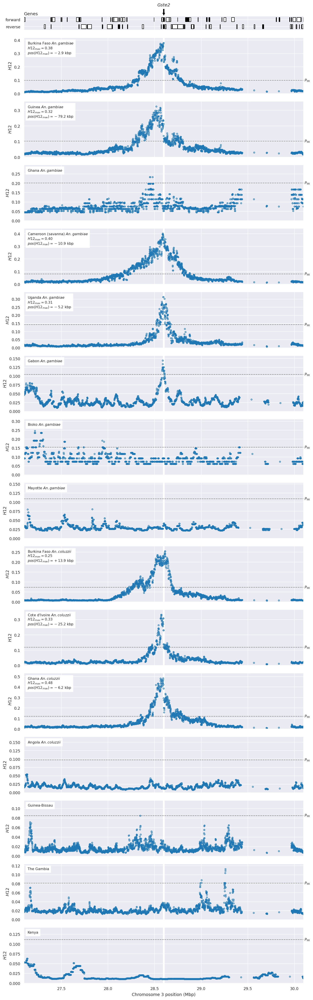

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
min,0.210375,0.254667,0.324356,-0.079232,-0.079232,-0.068910
max,0.296495,0.482645,0.578509,0.013875,0.013875,-0.005205


In [9]:
df_stats = fig_locus(
    chromosome=gste2.chromosome, center=gste2.chromosome_center/1e6, 
    flank=1.5, label=gste2['Name'], track_height=2,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)
df_stats.describe().loc[['count', 'min', 'max']]

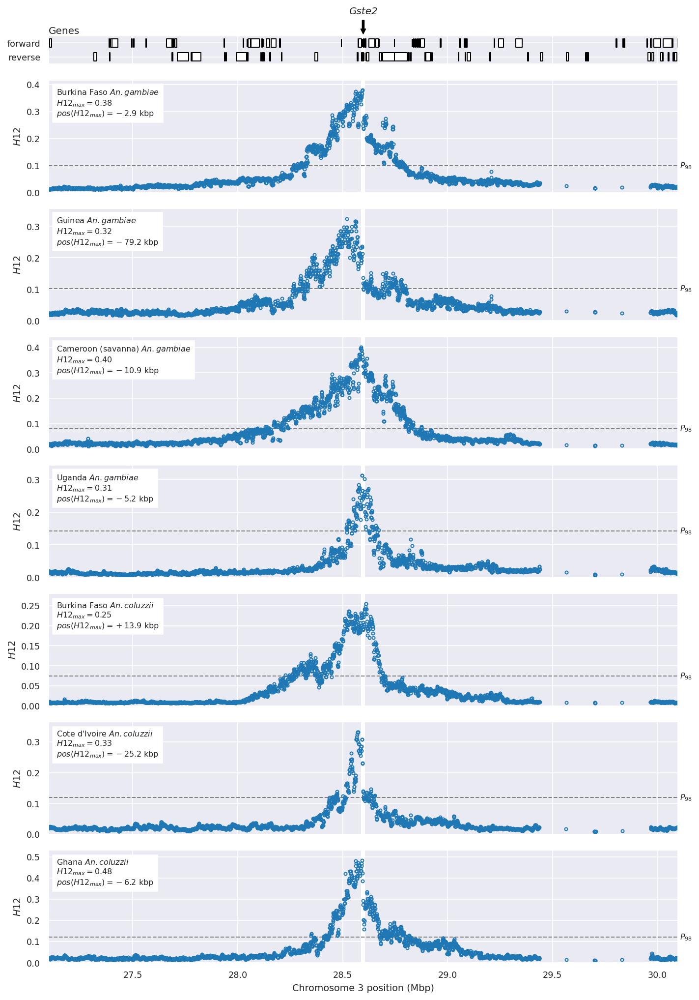

In [10]:
fig_locus(
    chromosome=gste2.chromosome, center=gste2.chromosome_center/1e6, 
    flank=1.5, label=gste2['Name'],
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
#         (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
#         (plot_h12, dict(pop='ga_gam')),
#         (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
#         (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
#         (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_gste2_h12.png'
);

## *Cyp6p3*

In [11]:
cyp6p3

seqid                            2R
source                   VectorBase
type                           gene
start                      28491415
end                        28493141
score                            -1
strand                            -
phase                            -1
Name                         Cyp6p3
biotype              protein_coding
chromosome                        2
chromosome_start           28491415
chromosome_end             28493141
chromosome_center       2.84923e+07
Name: AGAP002865, dtype: object

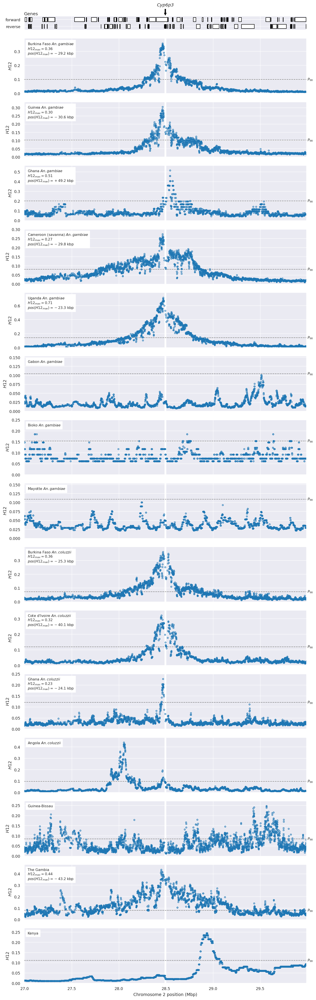

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
min,0.141385,0.227603,0.278182,-0.043211,-0.043211,-0.043211
max,0.433793,0.714326,0.774593,0.049171,0.049171,0.049171


In [12]:
df_stats = fig_locus(
    chromosome=cyp6p3.chromosome, center=cyp6p3.chromosome_center/1e6, 
    flank=1.5, label=cyp6p3['Name'], track_height=2,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)

df_stats.describe().loc[['count', 'min', 'max']]

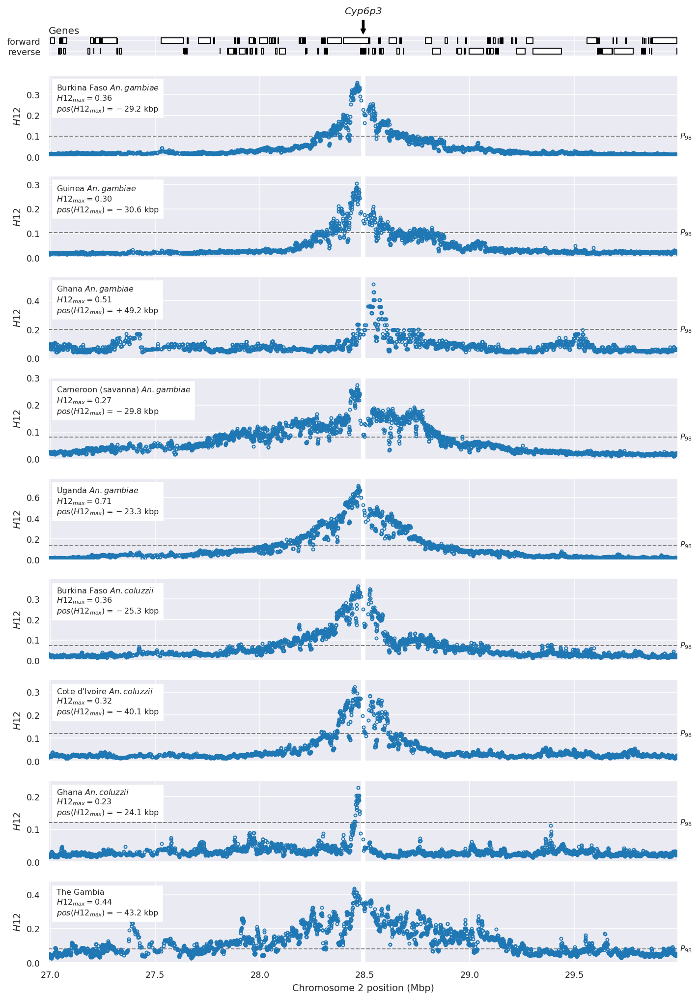

In [13]:
fig_locus(
    chromosome=cyp6p3.chromosome, center=cyp6p3.chromosome_center/1e6, 
    flank=1.5, label=cyp6p3['Name'],
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
#         (plot_h12, dict(pop='ga_gam')),
#         (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
#         (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_cyp6p3_h12.png'
);

## *Vgsc*

In [14]:
vgsc

seqid                            2L
source                   VectorBase
type                           gene
start                       2358158
end                         2431617
score                            -1
strand                            +
phase                            -1
Name                           Vgsc
biotype              protein_coding
chromosome                        2
chromosome_start           63903263
chromosome_end             63976722
chromosome_center         6.394e+07
Name: AGAP004707, dtype: object

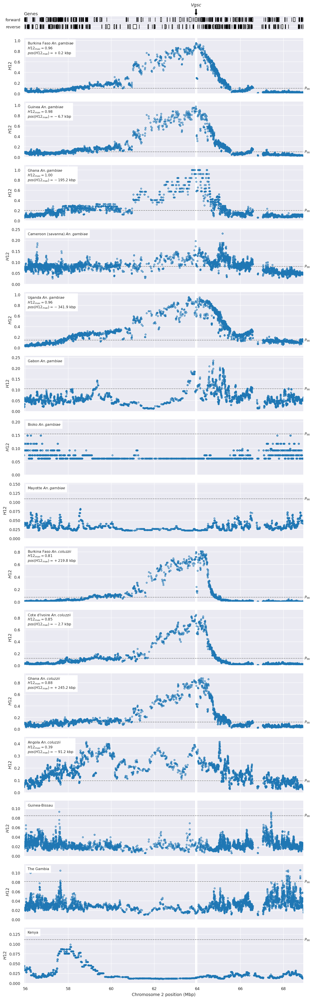

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
min,0.330539,0.389053,0.397025,-0.341929,-0.341929,-0.341929
max,1.000000,1.000000,1.000000,0.000217,0.245202,0.259389


In [15]:
df_stats = fig_locus(
    chromosome=vgsc.chromosome, center=vgsc.chromosome_center/1e6, 
    flank=(8, 5), label=vgsc['Name'], track_height=2, 
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)
df_stats.describe().loc[['count', 'min', 'max']]

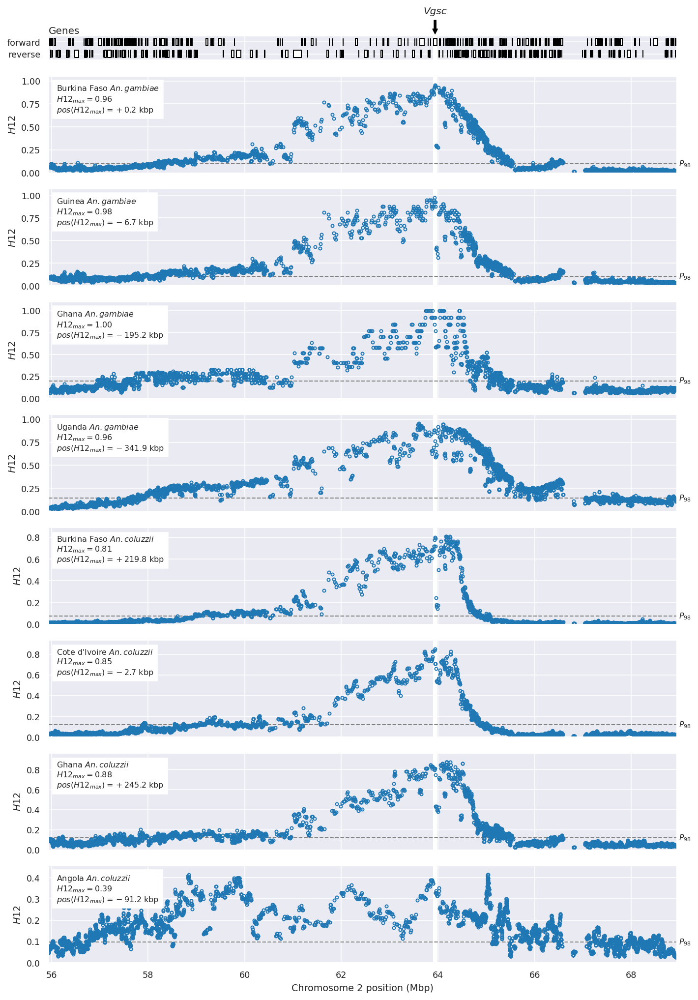

In [16]:
fig_locus(
    chromosome=vgsc.chromosome, center=vgsc.chromosome_center/1e6, 
    flank=(8, 5), label=vgsc['Name'],
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
#         (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
#         (plot_h12, dict(pop='ga_gam')),
#         (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
#         (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_vgsc_h12_pdist.png'
);

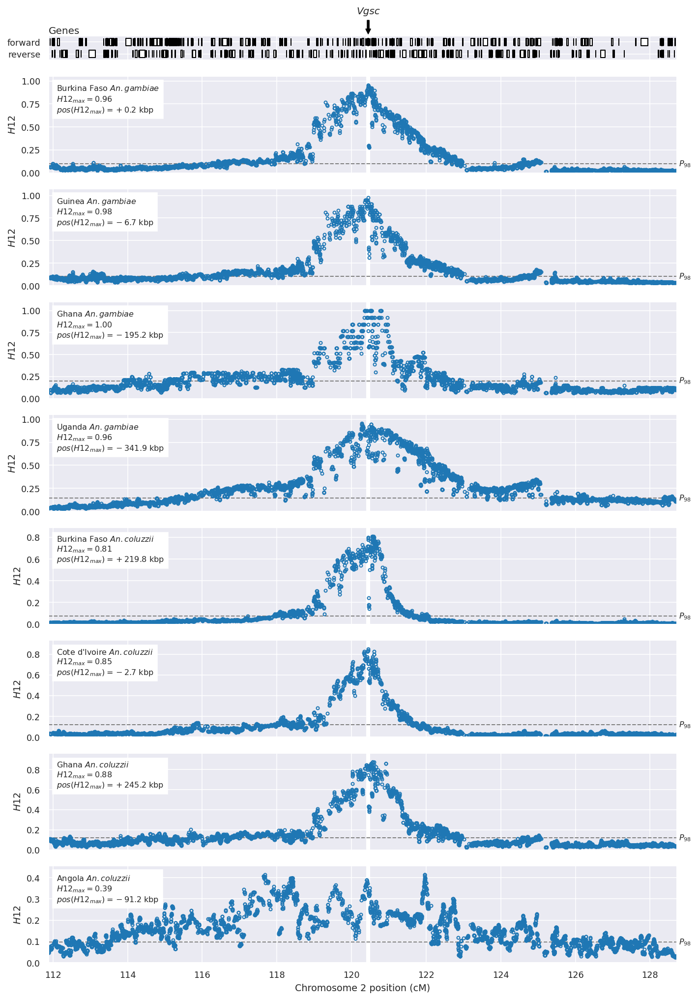

,pop,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
0,bf_gam,0.946538,0.957112,0.967746,0.000217,0.000217,0.000217
1,gn_gam,0.950937,0.975312,1.000000,-0.006749,-0.006749,-0.006749
2,gh_gam,1.000000,1.000000,1.000000,-0.195197,-0.195197,-0.195197
3,ug_gam,0.479711,0.955955,0.964684,-0.341929,-0.341929,-0.341929
4,bf_col,0.700711,0.811022,0.884089,0.000217,0.219787,0.000217
5,ci_col,0.741222,0.851617,0.864610,-0.216511,-0.002666,-0.002666
6,gh_col,0.680000,0.877521,0.911736,-0.058568,0.245202,0.259389
7,ao_col,0.330539,0.389053,0.397025,-0.091210,-0.091210,-0.091210


In [17]:
fig_locus(
    chromosome=vgsc.chromosome, center=vgsc.chromosome_center/1e6, 
    flank=(8, 5), label=vgsc['Name'], genetic_distance=True,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
#         (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
#         (plot_h12, dict(pop='ga_gam')),
#         (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
#         (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_vgsc_h12_gdist.png'
)

## *Gaba*

In [18]:
gaba

seqid                            2L
source                   VectorBase
type                           gene
start                      25363652
end                        25434556
score                            -1
strand                            +
phase                            -1
Name                           Gaba
biotype              protein_coding
chromosome                        2
chromosome_start           86908757
chromosome_end             86979661
chromosome_center       8.69442e+07
Name: AGAP006028, dtype: object

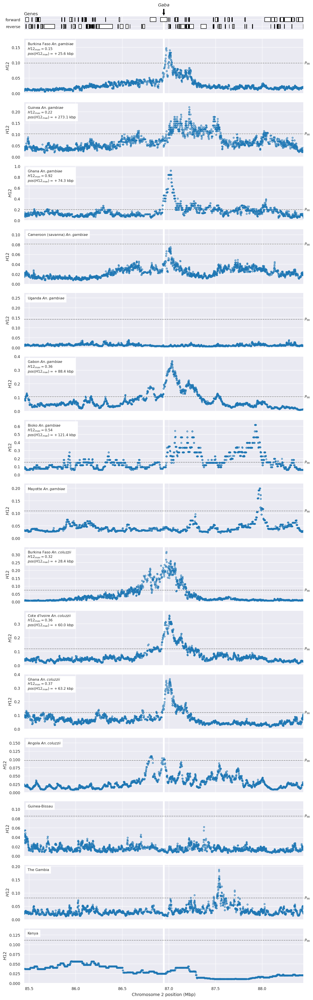

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
min,0.140064,0.148098,0.161094,0.019944,0.025600,0.028408
max,0.843750,0.920139,1.000000,0.305567,0.273126,0.273126


In [19]:
df_stats = fig_locus(
    chromosome=gaba.chromosome, center=gaba.chromosome_center/1e6, 
    flank=1.5, label=gaba['Name'], track_height=2,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)
df_stats.describe().loc[['count', 'min', 'max']]

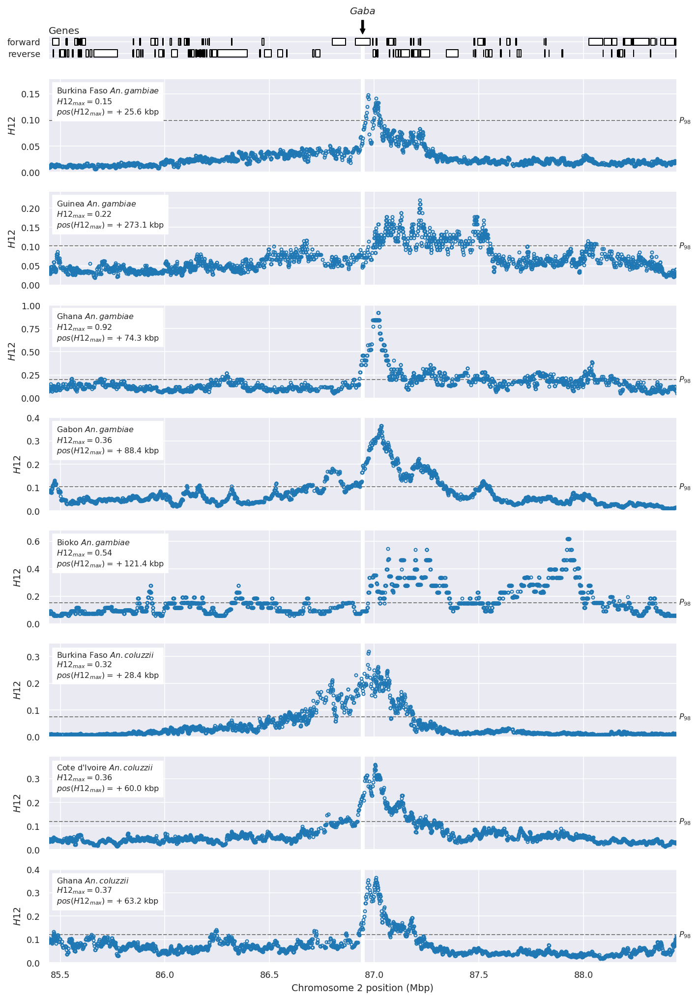

,pop,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
0,bf_gam,0.140064,0.148098,0.161094,0.025600,0.025600,0.064695
1,gn_gam,0.189375,0.221250,0.244375,0.273126,0.273126,0.273126
2,gh_gam,0.843750,0.920139,1.000000,0.074328,0.074328,0.074328
3,ga_gam,0.339635,0.364839,0.382273,0.088421,0.088421,0.088421
4,gq_gam,0.401235,0.543210,0.703704,0.305567,0.121394,0.121394
5,bf_col,0.289244,0.317689,0.347556,0.028408,0.028408,0.028408
6,ci_col,0.270780,0.360048,0.451696,0.019944,0.059986,0.059986
7,gh_col,0.324793,0.365785,0.398843,0.063196,0.063196,0.062485


In [20]:
fig_locus(
    chromosome=gaba.chromosome, center=gaba.chromosome_center/1e6, 
    flank=1.5, label=gaba['Name'],
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
#         (plot_h12, dict(pop='cm_sav_gam')),
#         (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
#         (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
#         (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_gaba_h12.png'
)

## *Ace1*

In [21]:
ace1

seqid                            2R
source                   VectorBase
type                           gene
start                       3483099
end                         3497400
score                            -1
strand                            +
phase                            -1
Name                           Ace1
biotype              protein_coding
chromosome                        2
chromosome_start            3483099
chromosome_end              3497400
chromosome_center       3.49025e+06
Name: AGAP001356, dtype: object

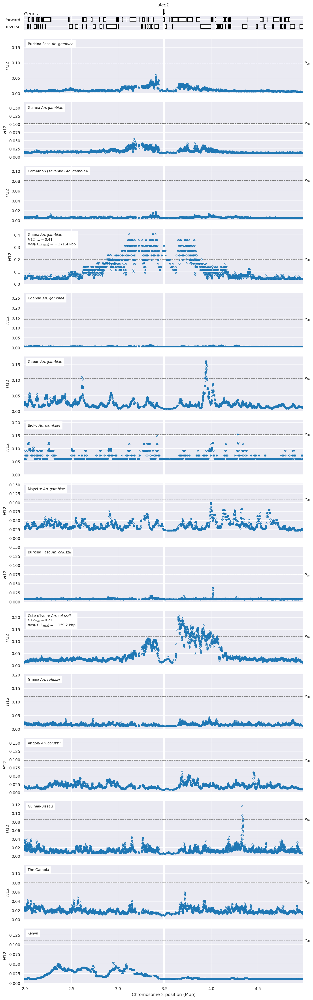

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
min,0.183892,0.207697,0.221583,-0.117911,-0.371430,-0.371430
max,0.357639,0.406250,0.458333,0.159213,0.159213,0.177893


In [22]:
df_stats = fig_locus(
    chromosome=ace1.chromosome, center=ace1.chromosome_center/1e6, 
    flank=1.5, label=ace1['Name'], track_height=2,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)
df_stats.describe().loc[['count', 'min', 'max']]

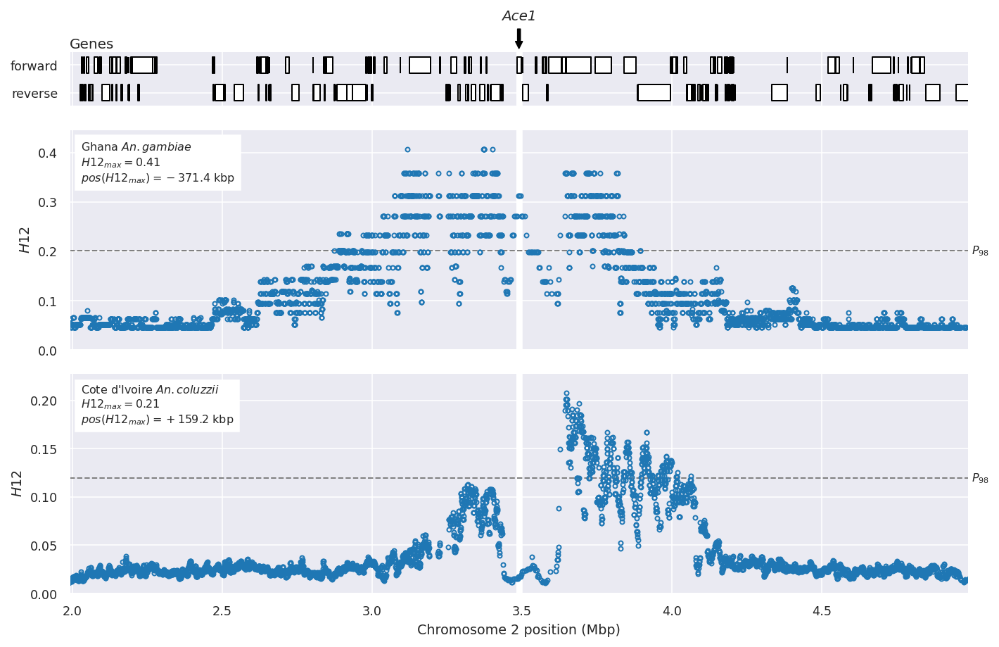

,pop,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
0,gh_gam,0.357639,0.406250,0.458333,-0.117911,-0.371430,-0.371430
1,ci_col,0.183892,0.207697,0.221583,0.159213,0.159213,0.177893


In [23]:
fig_locus(
    chromosome=ace1.chromosome, center=ace1.chromosome_center/1e6, 
    flank=1.5, label=ace1['Name'], track_height=2.5,
    tracks=(
#         (plot_h12, dict(pop='bf_gam')),
#         (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
#         (plot_h12, dict(pop='cm_sav_gam')),
#         (plot_h12, dict(pop='ug_gam')),
#         (plot_h12, dict(pop='ga_gam')),
#         (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
#         (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
#         (plot_h12, dict(pop='gh_col')),
#         (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
#         (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_ace1_h12.png'
)

## *Cyp9k1*

In [24]:
cyp9k1

seqid                             X
source                   VectorBase
type                           gene
start                      15240572
end                        15242864
score                            -1
strand                            -
phase                            -1
Name                         Cyp9k1
biotype              protein_coding
chromosome                        X
chromosome_start           15240572
chromosome_end             15242864
chromosome_center       1.52417e+07
Name: AGAP000818, dtype: object

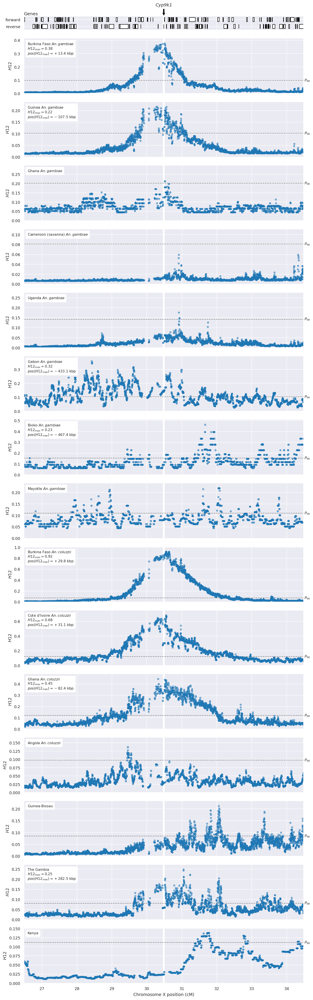

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
min,0.142500,0.215313,0.277778,-0.087817,-0.467435,-0.467435
max,0.905478,0.918692,0.932002,0.492843,0.282460,0.282460


In [25]:
df_stats = fig_locus(
    chromosome=cyp9k1.chromosome, center=cyp9k1.chromosome_center/1e6, 
    flank=2, label=cyp9k1['Name'], genetic_distance=True, track_height=2,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
        (plot_h12, dict(pop='gh_gam')),
        (plot_h12, dict(pop='cm_sav_gam')),
        (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
        (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
        (plot_h12, dict(pop='ao_col')),
        (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
        (plot_h12, dict(pop='ke')),
    ),
)
df_stats.describe().loc[['count', 'min', 'max']]

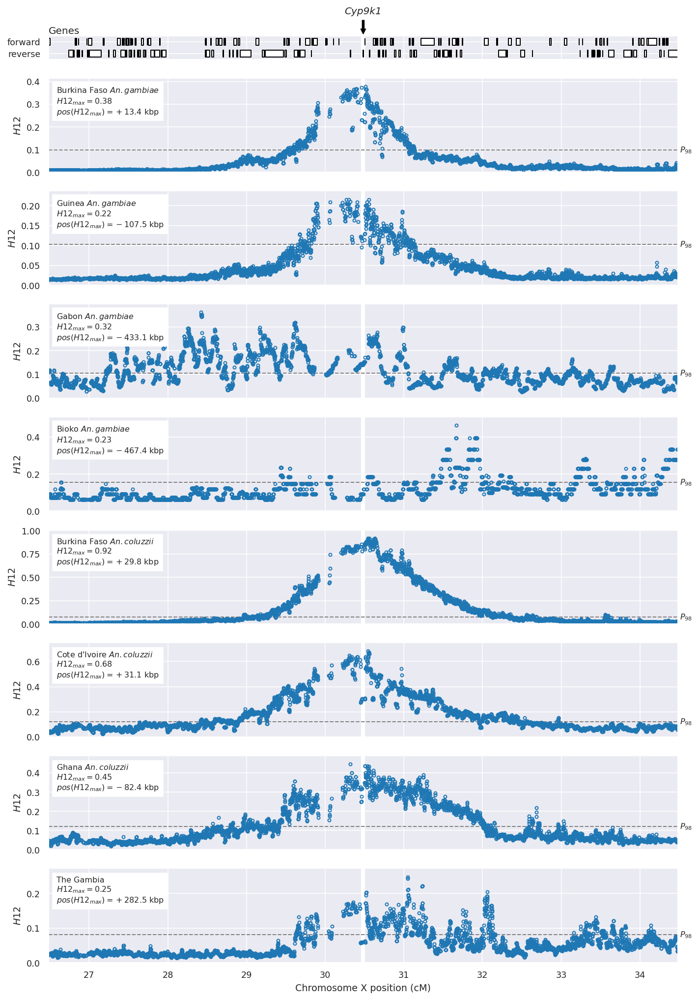

,h1_max,h12_max,h123_max,pos_h1_max,pos_h12_max,pos_h123_max
count,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
min,0.142500,0.215313,0.277778,-0.087817,-0.467435,-0.467435
max,0.905478,0.918692,0.932002,0.492843,0.282460,0.282460


In [26]:
df_stats = fig_locus(
    chromosome=cyp9k1.chromosome, center=cyp9k1.chromosome_center/1e6, 
    flank=2, label=cyp9k1['Name'], genetic_distance=True,
    tracks=(
        (plot_h12, dict(pop='bf_gam')),
        (plot_h12, dict(pop='gn_gam')),
#         (plot_h12, dict(pop='gh_gam')),
#         (plot_h12, dict(pop='cm_sav_gam')),
#         (plot_h12, dict(pop='ug_gam')),
        (plot_h12, dict(pop='ga_gam')),
        (plot_h12, dict(pop='gq_gam')),
#         (plot_h12, dict(pop='fr_gam')),
        (plot_h12, dict(pop='bf_col')),
        (plot_h12, dict(pop='ci_col')),
        (plot_h12, dict(pop='gh_col')),
#         (plot_h12, dict(pop='ao_col')),
#         (plot_h12, dict(pop='gw')),
        (plot_h12, dict(pop='gm')),
#         (plot_h12, dict(pop='ke')),
    ),
    savefig=here() / 'artwork/locus_cyp9k1_h12.png'
)
df_stats.describe().loc[['count', 'min', 'max']]